# Data analysis

This notebook is dedicated to the data acquisition, exploration and preprocessing stages of the PCL detection. 
This will explore / analyse the PCL dataset using distinct EDA techniques to identify linguistic pattersn in the dataset.
This the earlier parts (upto PCA) follow some of the specification's EDA techniques and adopt their numbering and section names after the spec.

More details and analysis in the report itself. This notebook is simply for code generation and exploration. Also serves as source code.

In [55]:
# Core imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import warnings
import spacy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
warnings.filterwarnings('ignore')

# Display settings
plt.rcParams.update({'figure.max_open_warning': 0})
sns.set_style('whitegrid')

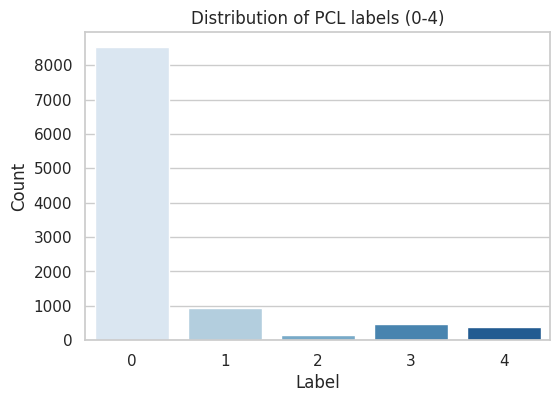

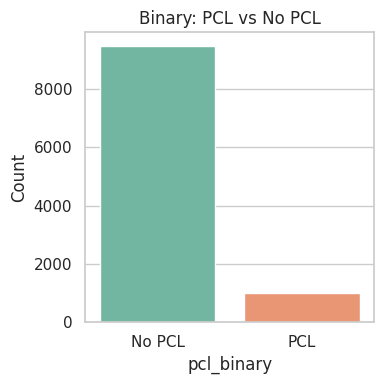

In [56]:
pcl_path = "data/dontpatronizeme_pcl.tsv"
cols = ["par_id","art_id","keyword","country","text","label"]
df = pd.read_csv(pcl_path, sep="\t", header=None, skiprows=4, names=cols, quoting=3)

# original labels 0-4
plt.figure(figsize=(6,4))
sns.countplot(x="label", data=df, palette="Blues")
plt.title("Distribution of PCL labels (0-4)")
plt.xlabel("Label")
plt.ylabel("Count")

# binary grouping: 0/1 -> No PCL ; 2/3/4 -> PCL
df["pcl_binary"] = df["label"].isin([2,3,4]).astype(int)
plt.figure(figsize=(4,4))
sns.countplot(x="pcl_binary", data=df, palette="Set2")
plt.xticks([0,1],["No PCL","PCL"])
plt.title("Binary: PCL vs No PCL")
plt.ylabel("Count")
plt.tight_layout()

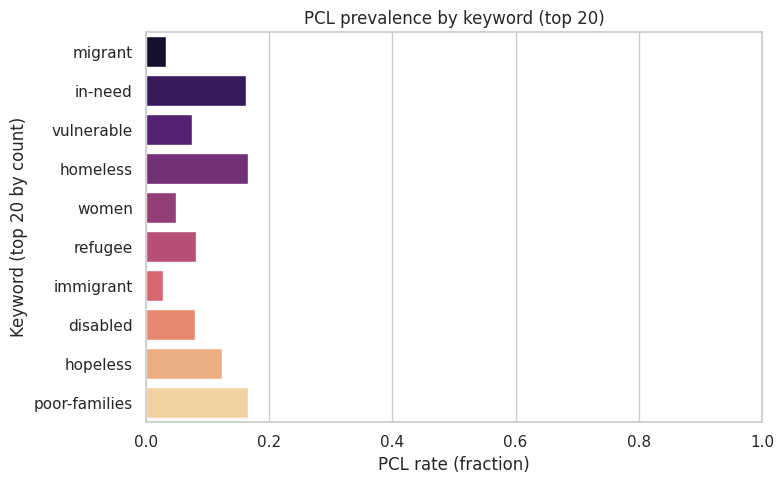

In [57]:
# compute proportion PCL per keyword
kw_tab = df.groupby("keyword")["pcl_binary"].agg(['sum','count']).reset_index()
kw_tab["pcl_rate"] = kw_tab["sum"] / kw_tab["count"]
top_kw = kw_tab.sort_values("count", ascending=False).head(20)

plt.figure(figsize=(8,5))
sns.barplot(x="pcl_rate", y="keyword", data=top_kw, palette="magma")
plt.xlabel("PCL rate (fraction)")
plt.ylabel("Keyword (top 20 by count)")
plt.title("PCL prevalence by keyword (top 20)")
plt.xlim(0,1)
plt.tight_layout()

In [58]:
# simple stopword set
ENGLISH_STOPWORDS = set([
    'the', 'a', 'an', 'and', 'or', 'but', 'in', 'on', 'at', 'to', 'for', 'of', 'with',
    'by', 'from', 'as', 'is', 'was', 'are', 'been', 'be', 'have', 'has', 'had', 'do',
    'does', 'did', 'will', 'would', 'could', 'should', 'may', 'might', 'must', 'can', 'said',
    'i', 'you', 'he', 'she', 'it', 'we', 'they', 'them', 'their', 'what', 'which',
    'who', 'where', 'when', 'why', 'how', 'this', 'that', 'these', 'those', ',', ' ', '.', '<h>', '</h>', 
    '\"', '(', ')', '[', ']', '{', '}', ':', ';', '-', '_', '/', '\\', '|', '@', '#', '$', '%', '^', '&', 
    '*', '+', '=', '~', '\"', '“', '”', '—', '…', '\"\"', "'s", "n't", "'re", "'ve", "'ll", "'d", '.\"', '--', '?', '\'', '\"\"\"'
])

## Basic Statistic profiling

In [59]:
# Remove any rows with missing text
print(f"\nRows with missing text values: {df['text'].isna().sum()}")
df_clean = df[df['text'].notna()].copy()
print(f"Rows after removing NaN: {len(df_clean)}")

# Token Count Analysis
df_clean['token_count'] = df_clean['text'].str.split().apply(len)
df_clean['char_count'] = df_clean['text'].str.len()


Rows with missing text values: 1
Rows after removing NaN: 10468


In [60]:
print("Token Count")
print(f"Average sentence length (tokens): {df_clean['token_count'].mean():.2f}")
print(f"Minimum tokens: {df_clean['token_count'].min()}")
print(f"Maximum tokens: {df_clean['token_count'].max()}")
print(f"Median tokens: {df_clean['token_count'].median():.2f}")
print(f"Std Dev tokens: {df_clean['token_count'].std():.2f}")

print("Character Count")
print(f"Average text length (characters): {df_clean['char_count'].mean():.2f}")
print(f"Minimum characters: {df_clean['char_count'].min()}")
print(f"Maximum characters: {df_clean['char_count'].max()}")

Token Count
Average sentence length (tokens): 48.43
Minimum tokens: 1
Maximum tokens: 909
Median tokens: 42.00
Std Dev tokens: 29.09
Character Count
Average text length (characters): 267.61
Minimum characters: 8
Maximum characters: 5501


In [61]:
all_words = ' '.join(df_clean['text']).lower().split()
vocab_size = len(set(all_words))
print(f"Vocabulary Statistics")
print(f"Total unique words: {vocab_size}")
print(f"Total word occurrences: {len(all_words)}")
print(f"Type-Token Ratio (TTR): {vocab_size / len(all_words):.4f}")

Vocabulary Statistics
Total unique words: 33752
Total word occurrences: 506935
Type-Token Ratio (TTR): 0.0666


In [62]:
print(f"Class Distribution")
print("Original Labels (0-4):")
print(df_clean['label'].value_counts().sort_index())
print(f"\nLabel distribution (%):")
print((df_clean['label'].value_counts(normalize=True).sort_index() * 100).round(2))

Class Distribution
Original Labels (0-4):
label
0    8528
1     947
2     144
3     458
4     391
Name: count, dtype: int64

Label distribution (%):
label
0    81.47
1     9.05
2     1.38
3     4.38
4     3.74
Name: proportion, dtype: float64


In [63]:
print(f"Binary PCL Distribution:")
print(df_clean['pcl_binary'].value_counts().sort_index())
print(f"\nBinary PCL distribution (%):")
print((df_clean['pcl_binary'].value_counts(normalize=True).sort_index() * 100).round(2))

Binary PCL Distribution:
pcl_binary
0    9475
1     993
Name: count, dtype: int64

Binary PCL distribution (%):
pcl_binary
0    90.51
1     9.49
Name: proportion, dtype: float64


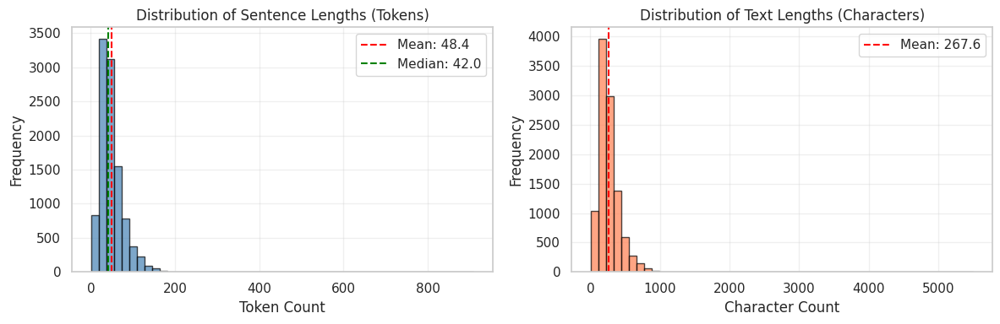

In [64]:
# Visualize the token distrubutions
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(df_clean['token_count'], bins=50, color='steelblue', edgecolor='black', alpha=0.7)
axes[0].axvline(df_clean['token_count'].mean(), color='red', linestyle='--', label=f'Mean: {df_clean["token_count"].mean():.1f}')
axes[0].axvline(df_clean['token_count'].median(), color='green', linestyle='--', label=f'Median: {df_clean["token_count"].median():.1f}')
axes[0].set_xlabel("Token Count")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Distribution of Sentence Lengths (Tokens)")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].hist(df_clean['char_count'], bins=50, color='coral', edgecolor='black', alpha=0.7)
axes[1].axvline(df_clean['char_count'].mean(), color='red', linestyle='--', label=f'Mean: {df_clean["char_count"].mean():.1f}')
axes[1].set_xlabel("Character Count")
axes[1].set_ylabel("Frequency")
axes[1].set_title("Distribution of Text Lengths (Characters)")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Lexical Analysis

In [65]:
df_clean['text_lower'] = df_clean['text'].str.lower()

# Extract content words (non-stopwords)
def get_content_words(text):
    return [word for word in text.split() if word not in ENGLISH_STOPWORDS]

df_clean['content_word_count'] = df_clean['text_lower'].apply(lambda x: len(get_content_words(x)))
df_clean['content_word_density'] = df_clean['content_word_count'] / df_clean['token_count']

# Get all content words for frequency analysis
all_content_words = []
for text in df_clean['text_lower']:
    all_content_words.extend(get_content_words(text))

print(f"Total content words (non-stopwords): {len(all_content_words)}")
print(f"Average content word density: {df_clean['content_word_density'].mean():.4f} ({df_clean['content_word_density'].mean() * 100:.2f}%)")
print(f"Average content word count per text: {df_clean['content_word_count'].mean():.2f}")
print(f"Min/Max content word density: {df_clean['content_word_density'].min():.4f} / {df_clean['content_word_density'].max():.4f}")

print(f"\nUnique content words (vocabulary): {len(set(all_content_words))}")
print(f"Stopwords removed: {len(all_words) - len(all_content_words)} ({(1 - len(all_content_words)/len(all_words))*100:.1f}%)")

Total content words (non-stopwords): 283045
Average content word density: 0.5669 (56.69%)
Average content word count per text: 27.04
Min/Max content word density: 0.2000 / 1.0000

Unique content words (vocabulary): 33671
Stopwords removed: 223890 (44.2%)


In [66]:
print("Top 25 Most Frequent Words")
content_word_freq = Counter(all_content_words)
top_content_words = content_word_freq.most_common(25)
for i, (word, count) in enumerate(top_content_words, 1):
    print(f"{i:2d}. {word:20s} {count:6d} ({count/len(all_content_words)*100:5.2f}%)")

Top 25 Most Frequent Words
 1. people                 1839 ( 0.65%)
 2. not                    1838 ( 0.65%)
 3. women                  1700 ( 0.60%)
 4. were                   1371 ( 0.48%)
 5. need                   1344 ( 0.47%)
 6. families               1339 ( 0.47%)
 7. immigrants             1292 ( 0.46%)
 8. more                   1253 ( 0.44%)
 9. vulnerable             1202 ( 0.42%)
10. his                    1179 ( 0.42%)
11. poor                   1173 ( 0.41%)
12. disabled               1123 ( 0.40%)
13. children               1037 ( 0.37%)
14. homeless               1029 ( 0.36%)
15. also                    983 ( 0.35%)
16. all                     969 ( 0.34%)
17. refugees                964 ( 0.34%)
18. about                   944 ( 0.33%)
19. one                     893 ( 0.32%)
20. there                   892 ( 0.32%)
21. government              834 ( 0.29%)
22. new                     802 ( 0.28%)
23. out                     789 ( 0.28%)
24. many                    78

In [67]:
print(" Top 15 Word Bigrams")
content_bigrams = []
for text in df_clean['text_lower']:
    content_words = get_content_words(text)
    for i in range(len(content_words) - 1):
        content_bigrams.append((content_words[i], content_words[i+1]))

content_bigram_freq = Counter(content_bigrams)
top_content_bigrams = content_bigram_freq.most_common(15)

for i, (bigram, count) in enumerate(top_content_bigrams, 1):
    print(f"{i:2d}. {bigram[0]:15s} {bigram[1]:15s} : {count:5d}")

 Top 15 Word Bigrams
 1. poor            families        :   909
 2. more            than            :   384
 3. illegal         immigrants      :   307
 4. most            vulnerable      :   206
 5. per             cent            :   165
 6. united          states          :   161
 7. homeless        people          :   136
 8. last            year            :   127
 9. disabled        people          :   118
10. sri             lanka           :   107
11. there           no              :   106
12. new             york            :   104
13. people          need            :   104
14. hong            kong            :   101
15. men             women           :   100


In [68]:
print("Top 10 Word Trigrams")
content_trigrams = []
for text in df_clean['text_lower']:
    content_words = get_content_words(text)
    for i in range(len(content_words) - 2):
        content_trigrams.append((content_words[i], content_words[i+1], content_words[i+2]))

content_trigram_freq = Counter(content_trigrams)
top_content_trigrams = content_trigram_freq.most_common(10)
for i, (trigram, count) in enumerate(top_content_trigrams, 1):
    print(f"{i:2d}. {trigram[0]:12s} {trigram[1]:12s} {trigram[2]:12s} : {count:4d}")

Top 10 Word Trigrams
 1. children     poor         families     :   81
 2. president    donald       trump        :   53
 3. students     poor         families     :   33
 4. many         poor         families     :   32
 5. un           refugee      agency       :   31
 6. come         poor         families     :   28
 7. poor         families     were         :   25
 8. were         left         homeless     :   21
 9. more         than         half         :   20
10. poor         families     not          :   20


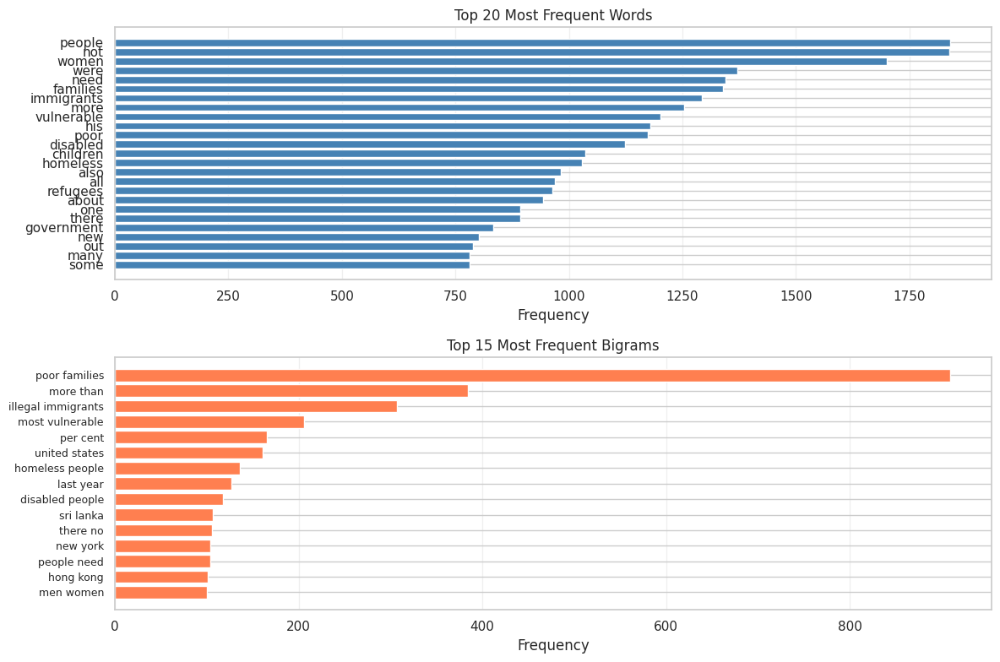

In [69]:
# Visualize word frequency
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# Top 20 words
words, counts = zip(*top_content_words)
axes[0].barh(range(len(words)), counts, color='steelblue')
axes[0].set_yticks(range(len(words)))
axes[0].set_yticklabels(words)
axes[0].set_xlabel("Frequency")
axes[0].set_title("Top 20 Most Frequent Words")
axes[0].invert_yaxis()
axes[0].grid(True, alpha=0.3, axis='x')

# Top 15 bigrams
bigram_labels = [f"{b[0]} {b[1]}" for b, _ in top_content_bigrams]
bigram_counts = [c for _, c in top_content_bigrams]
axes[1].barh(range(len(bigram_labels)), bigram_counts, color='coral')
axes[1].set_yticks(range(len(bigram_labels)))
axes[1].set_yticklabels(bigram_labels, fontsize=9)
axes[1].set_xlabel("Frequency")
axes[1].set_title("Top 15 Most Frequent Bigrams")
axes[1].invert_yaxis()
axes[1].grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

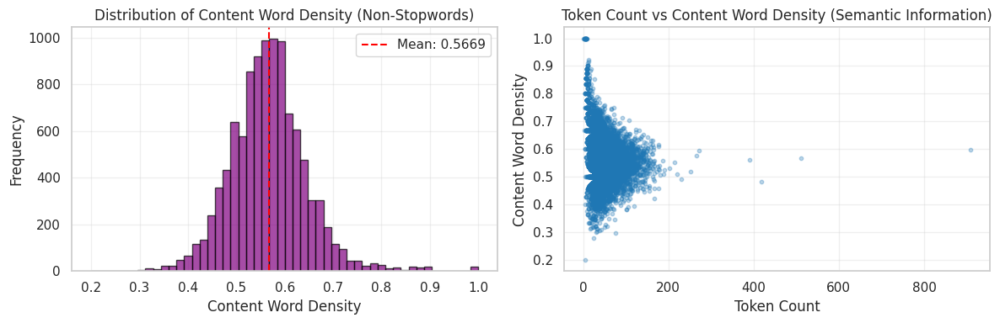

In [70]:
# Stopword density visualization
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(df_clean['content_word_density'], bins=50, color='purple', alpha=0.7, edgecolor='black')
axes[0].axvline(df_clean['content_word_density'].mean(), color='red', linestyle='--', 
                label=f'Mean: {df_clean["content_word_density"].mean():.4f}')
axes[0].set_xlabel("Content Word Density")
axes[0].set_ylabel("Frequency")
axes[0].set_title("Distribution of Content Word Density (Non-Stopwords)")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].scatter(df_clean['token_count'], df_clean['content_word_density'], alpha=0.3, s=10)
axes[1].set_xlabel("Token Count")
axes[1].set_ylabel("Content Word Density")
axes[1].set_title("Token Count vs Content Word Density (Semantic Information)")
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## NER and PCA

In [71]:
def run_ner_and_add_features(df, text_col='text', model_name='en_core_web_sm'):
    """Run spaCy NER on a DataFrame column and add per-entity-count columns.

    Returns the sorted list of entity types discovered.
    """
    try:
        nlp = spacy.load(model_name)
    except Exception as e:
        raise RuntimeError(f"Failed to load spaCy model '{model_name}': {e}")

    # Use spaCy's efficient pipe for batching
    ner_counts = []
    for doc in nlp.pipe(df[text_col].astype(str), batch_size=64):
        ner_counts.append(Counter([ent.label_ for ent in doc.ents]))

    # Determine all entity types found
    entity_types = sorted({t for c in ner_counts for t in c})

    # Add one column per entity type (counts)
    for t in entity_types:
        col_name = f'ner_{t.lower()}'
        df[col_name] = [c.get(t, 0) for c in ner_counts]

    return entity_types, df

In [72]:
print("Running NER and adding feature columns")
all_entity_types, dff = run_ner_and_add_features(df_clean, text_col='text')
print(f"Found entity types: {all_entity_types}")
print(f"Added {len(all_entity_types)} NER feature columns")

Running NER and adding feature columns
Found entity types: ['CARDINAL', 'DATE', 'EVENT', 'FAC', 'GPE', 'LANGUAGE', 'LAW', 'LOC', 'MONEY', 'NORP', 'ORDINAL', 'ORG', 'PERCENT', 'PERSON', 'PRODUCT', 'QUANTITY', 'TIME', 'WORK_OF_ART']
Added 18 NER feature columns


In [73]:
nlp = spacy.load('en_core_web_sm')
docs = None

def get_docs():
    global docs
    if docs is not None:
        return docs
    docs = list(nlp.pipe(df_clean['text'].astype(str), batch_size=64))
    return docs

In [74]:
# Top entities per entity type, split by pcl_binary (side-by-side tables)
TOP_N = 5
from collections import defaultdict
# Use spaCy pipeline to collect actual entity surface forms per label

pos_counters = defaultdict(Counter)
neg_counters = defaultdict(Counter)

# Iterate texts and their binary labels in batches for speed
for doc, pcl in zip(get_docs(), df_clean['pcl_binary'].astype(int)):
    for ent in doc.ents:
        lbl = ent.label_
        txt = ent.text.strip()
        if not txt:
            continue
        if pcl == 1:
            pos_counters[lbl][txt] += 1
        else:
            neg_counters[lbl][txt] += 1

# Build side-by-side DataFrame outputs for each entity label
all_labels = sorted(set(list(pos_counters.keys()) + list(neg_counters.keys())))
for lbl in all_labels:
    pos_top = pos_counters[lbl].most_common(TOP_N)
    neg_top = neg_counters[lbl].most_common(TOP_N)
    # pad to TOP_N
    while len(pos_top) < TOP_N:
        pos_top.append(("", 0))
    while len(neg_top) < TOP_N:
        neg_top.append(("", 0))
    rows = []
    for i in range(TOP_N):
        n_ent, n_cnt = neg_top[i]
        p_ent, p_cnt = pos_top[i]
        rows.append({ 'Negative entity': n_ent, 'Negative count': n_cnt, 'Positive entity': p_ent, 'Positive count': p_cnt })
    tbl = pd.DataFrame(rows)
    print(f'Entity label: {lbl}')
    display(tbl)

Entity label: CARDINAL


,Negative entity,Negative count,Positive entity,Positive count
0,one,324,one,27
1,two,312,two,21
2,three,164,millions,11
3,thousands,113,thousands,11
4,four,105,three,8


Entity label: DATE


,Negative entity,Negative count,Positive entity,Positive count
0,today,124,today,23
1,Tuesday,80,Christmas,17
2,Friday,77,Today,8
3,Thursday,76,daily,8
4,this year,73,Tuesday,7


Entity label: EVENT


,Negative entity,Negative count,Positive entity,Positive count
0,World War II,14,Lent,2
1,World Cup,12,the World Refugee Day,1
2,the Paris Agreement,4,the Year 2014,1
3,World War Two,3,Olympic,1
4,International Day,3,the Holy Year of Mercy,1


Entity label: FAC


,Negative entity,Negative count,Positive entity,Positive count
0,City Hall,4,Vatican,2
1,the White House,4,mosques,1
2,Metro,4,the Shiv Sena,1
3,mosques,3,Lakshan Madurasinghe - Country Public Affairs,1
4,Vatican,3,the Las Rozas,1


Entity label: GPE


,Negative entity,Negative count,Positive entity,Positive count
0,US,288,Nigeria,15
1,Bangladesh,151,America,14
2,India,145,Pakistan,12
3,the United States,127,India,10
4,Pakistan,115,Australia,7


Entity label: LANGUAGE


,Negative entity,Negative count,Positive entity,Positive count
0,English,48,English,6
1,Filipino,11,Filipino,3
2,Spanish,10,,0
3,Cantonese,2,,0
4,Arabic,1,,0


Entity label: LAW


,Negative entity,Negative count,Positive entity,Positive count
0,Constitution,6,Constitution,3
1,the Immigration Act,3,Others v Grootboom and Others,1
2,Protocol,2,section 26,1
3,No 1,2,the Deferred Action for Childhood Arrivals,1
4,SPF 15,2,Matthew 25,1


Entity label: LOC


,Negative entity,Negative count,Positive entity,Positive count
0,Europe,151,Europe,13
1,Africa,54,Africa,12
2,the Middle East,37,Mediterranean,5
3,Caribbean,32,the Middle East,3
4,Asia,26,West,3


Entity label: MONEY


,Negative entity,Negative count,Positive entity,Positive count
0,60 per cent,5,$25 billion,2
1,10 per cent,4,9.25,1
2,13 per cent,4,$1 million,1
3,70 per cent,4,"more than $83,000",1
4,"100,000",3,a million dollar,1


Entity label: NORP


,Negative entity,Negative count,Positive entity,Positive count
0,Muslim,111,African,12
1,Syrian,99,Muslim,10
2,Chinese,84,Nigerians,7
3,Irish,73,Christians,7
4,African,72,Muslims,6


Entity label: ORDINAL


,Negative entity,Negative count,Positive entity,Positive count
0,first,290,first,27
1,second,98,second,8
2,third,49,third,3
3,First,19,First,2
4,fourth,16,tertiary,2


Entity label: ORG


,Negative entity,Negative count,Positive entity,Positive count
0,UN,127,UN,10
1,Trump,125,UNHCR,6
2,EU,96,IRC,5
3,UNHCR,59,Group,4
4,Congress,43,Congress,4


Entity label: PERCENT


,Negative entity,Negative count,Positive entity,Positive count
0,20 percent,7,40 percent,1
1,70%,6,50 percent,1
2,100%,5,around 17%,1
3,37%,5,only 18 percent,1
4,30%,5,90 percent,1


Entity label: PERSON


,Negative entity,Negative count,Positive entity,Positive count
0,Trump,110,Jesus,7
1,Donald Trump,87,Francis,6
2,Obama,32,Donald Trump,4
3,Sri Lanka,17,Ryan,4
4,Tamil,16,Lee,3


Entity label: PRODUCT


,Negative entity,Negative count,Positive entity,Positive count
0,Rohingya,4,the Winnipeg Jets,1
1,JavaScript,4,Adivasis,1
2,Maori,3,Veteran,1
3,Cullen,2,Rohingya,1
4,Winnipeg,2,Sanco,1


Entity label: QUANTITY


,Negative entity,Negative count,Positive entity,Positive count
0,more than 2.6 million,4,a few kilometres,1
1,more than 1 million,2,about 200 tons,1
2,10km,2,22 miles,1
3,5-marla,1,billion-pound,1
4,"64,000-acre",1,"approximately 60,000 pounds",1


Entity label: TIME


,Negative entity,Negative count,Positive entity,Positive count
0,night,16,the night,2
1,hours,16,this morning,2
2,evening,9,24-hour,2
3,morning,8,tonight,2
4,24-hour,7,4 p.m.,1


Entity label: WORK_OF_ART


,Negative entity,Negative count,Positive entity,Positive count
0,PhD,6,Bible,4
1,Romualdez,4,Mudau,1
2,Love,2,Night,1
3,Playboy,2,Holy Thursday Mass,1
4,Bumble,2,Emmanuel,1


NER columns: ['ner_cardinal', 'ner_date', 'ner_event', 'ner_fac', 'ner_gpe', 'ner_language', 'ner_law', 'ner_loc', 'ner_money', 'ner_norp', 'ner_ordinal', 'ner_org', 'ner_percent', 'ner_person', 'ner_product', 'ner_quantity', 'ner_time', 'ner_work_of_art']


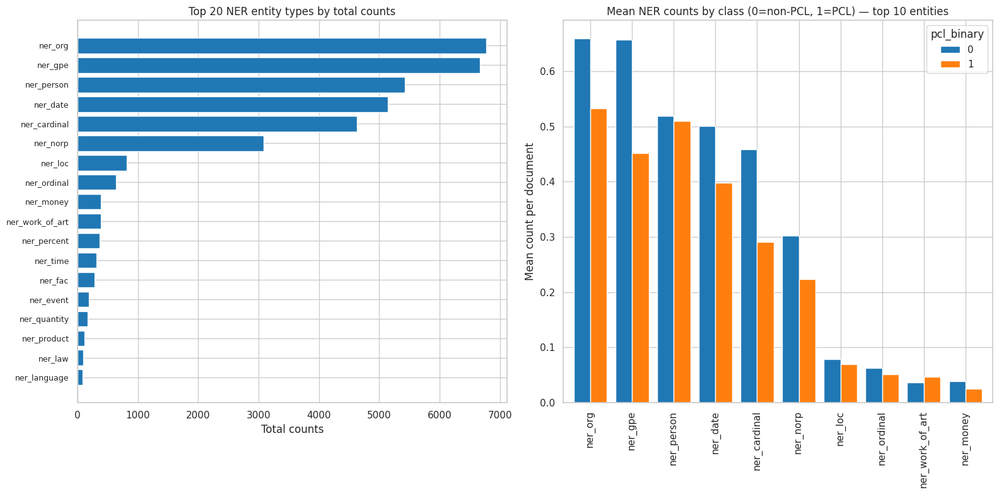

In [75]:
ner_cols = [c for c in dff.columns if c.startswith("ner_")]
print("NER columns:", ner_cols[:20])

totals = dff[ner_cols].sum().sort_values(ascending=False)
top20 = totals.head(20)

# mean per class for top entities
means_by_class = dff.groupby("pcl_binary")[ner_cols].mean().T
top10 = means_by_class.loc[top20.index[:10]]

# Plot: left = top20 totals; right = grouped bar for top10 means by class
fig, axes = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios':[1,1]})

# Left: horizontal bar of top 20 totals
axes[0].barh(top20.index[::-1], top20.values[::-1], color="tab:blue")
axes[0].set_title("Top 20 NER entity types by total counts")
axes[0].set_xlabel("Total counts")
axes[0].tick_params(axis='y', labelsize=9)

# Right: grouped bar (mean per class) for top10 entities
top10_sorted = top10.loc[top10.sum(axis=1).sort_values(ascending=False).index]
top10_sorted.plot(kind="bar", ax=axes[1], width=0.8)
axes[1].set_title("Mean NER counts by class (0=non-PCL, 1=PCL) — top 10 entities")
axes[1].set_ylabel("Mean count per document")
axes[1].legend(title="pcl_binary", loc="upper right")

plt.tight_layout()
plt.show()

# Also save separate files
top20.plot(kind="barh", figsize=(8,10), color="tab:blue", legend=False)
plt.title("Top 20 NER entity types by total counts")
plt.xlabel("Total counts")
plt.tight_layout()
plt.close()

top10_sorted.plot(kind="bar", figsize=(10,6))
plt.title("Mean NER counts by class (top 10 entities)")
plt.ylabel("Mean count per document")
plt.tight_layout()
plt.close()

In [76]:
NO_SHOWN_CHRS = 100 # for the interactive map
# Filter very-rare entities (keep features with sum > threshold)
THRESHOLD = 5
top_k_keywords = 20
top_n_entities = 25

In [77]:
# ner pca
df_ner = dff.copy() # create copy dataframe to keep original
ner_cols = [c for c in df_ner.columns if c.startswith("ner_")]

if not ner_cols:
    raise RuntimeError("No NER columns found. Run NER step first.")

if "token_count" in df_ner.columns:
    X_raw = df_ner[ner_cols].fillna(0).div(df_ner["token_count"].replace(0,1), axis=0)
else:
    X_raw = df_ner[ner_cols].fillna(0)

keep = X_raw.columns[X_raw.sum() > THRESHOLD]
X = X_raw[keep].astype(float)
print(f"Using {X.shape[1]} NER features after rarity filter")

y = df_ner["pcl_binary"].astype(int)

scaler = StandardScaler(with_mean=True, with_std=True)
Xs = scaler.fit_transform(X)

pca_full = PCA()
pca_full.fit(Xs)
explained = pca_full.explained_variance_ratio_
cum_explained = explained.cumsum() # hehe

n_comp = int(np.argmax(cum_explained >= 0.95) + 1)
n_comp = min(max(2, n_comp), min(50, X.shape[1]))   # sane limits
print("Suggested n_components:", n_comp)

pca = PCA(n_components=n_comp, random_state=42)
X_pca = pca.fit_transform(Xs)
cols_pca = [f"pc{i+1}" for i in range(X_pca.shape[1])]
X_pca_df = pd.DataFrame(X_pca, columns=cols_pca, index=X.index)

loadings = pd.DataFrame(pca.components_.T, index=X.columns, columns=cols_pca)

for pc in cols_pca[:min(6, len(cols_pca))]:
    top_pos = loadings[pc].sort_values(ascending=False).head(8)
    top_neg = loadings[pc].sort_values().head(8)
    print(f"{pc} — top + contributors:\n{top_pos}")
    print(f"{pc} — top - contributors:\n{top_neg}")

Using 13 NER features after rarity filter
Suggested n_components: 13
pc1 — top + contributors:
ner_cardinal    0.500547
ner_date        0.500476
ner_gpe         0.475337
ner_norp        0.277595
ner_org         0.252020
ner_loc         0.228314
ner_ordinal     0.179577
ner_fac         0.117173
Name: pc1, dtype: float64
pc1 — top - contributors:
ner_work_of_art   -0.098475
ner_person         0.013552
ner_percent        0.076162
ner_money          0.095960
ner_time           0.097280
ner_fac            0.117173
ner_ordinal        0.179577
ner_loc            0.228314
Name: pc1, dtype: float64
pc2 — top + contributors:
ner_fac            0.483333
ner_person         0.461386
ner_time           0.352057
ner_ordinal        0.319410
ner_org            0.198533
ner_date           0.172249
ner_work_of_art    0.029790
ner_money         -0.062919
Name: pc2, dtype: float64
pc2 — top - contributors:
ner_loc           -0.316542
ner_norp          -0.255191
ner_percent       -0.239608
ner_gpe          

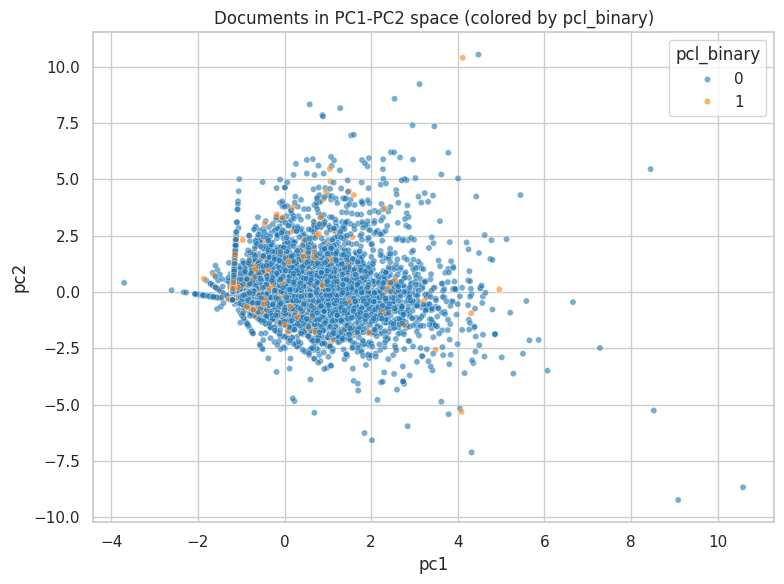

In [78]:
plt.figure(figsize=(8,6))
if "pc1" in X_pca_df.columns and "pc2" in X_pca_df.columns:
    sns.scatterplot(x="pc1", y="pc2", hue=y, palette=["#1f77b4","#ff7f0e"], data=X_pca_df.assign(pcl=y),
                    alpha=0.6, s=20)
    plt.title("Documents in PC1-PC2 space (colored by pcl_binary)")
    plt.legend(title="pcl_binary")
    plt.tight_layout()
    plt.show()

In [79]:
df_plot = X_pca_df[['pc1','pc2']].copy()
df_plot['pcl_binary'] = y.loc[df_plot.index].astype(int).astype(str)
df_plot['label'] = df_ner.loc[df_plot.index, 'keyword'].astype(str)
df_plot['country'] = df_ner.loc[df_plot.index, 'country'].astype(str) if 'country' in df_ner.columns else ''
df_plot['text_full'] = df_ner.loc[df_plot.index, 'text'].astype(str).str.replace('\n', ' ')
df_plot['text_preview'] = df_plot['text_full'].str.slice(0,NO_SHOWN_CHRS) + df_plot['text_full'].str.slice(NO_SHOWN_CHRS).apply(lambda s: '...' if len(s)>0 else '')

# include preview in custom_data so we can reference it in the hovertemplate
fig = px.scatter(
    df_plot,
    x='pc1', y='pc2',
    color='pcl_binary',
    color_discrete_map={'0':'#1f77b4','1':'#ff7f0e'},
    hover_name='label',
    hover_data={'pcl_binary':True, 'pc1':':.3f', 'pc2':':.3f'},
    custom_data=['country','text_preview','text_full'],
    text='label',
    title='PC1 vs PC2 (interactive)',
)

fig.update_traces(
    marker=dict(size=6, opacity=0.75),
    textposition='top center',
    hovertemplate=(
        "<b>%{hovertext}</b><br><br>"
        "PC1: %{x:.3f}, PC2: %{y:.3f}<br>"
        "country: %{customdata[0]}<br><br>"
        "text: %{customdata[1]}<br>"
        "<extra></extra>"
    )
)

fig.update_layout(height=700, width=900, legend_title_text='pcl_binary', margin=dict(l=40,r=40,t=60,b=40))
fig.show()

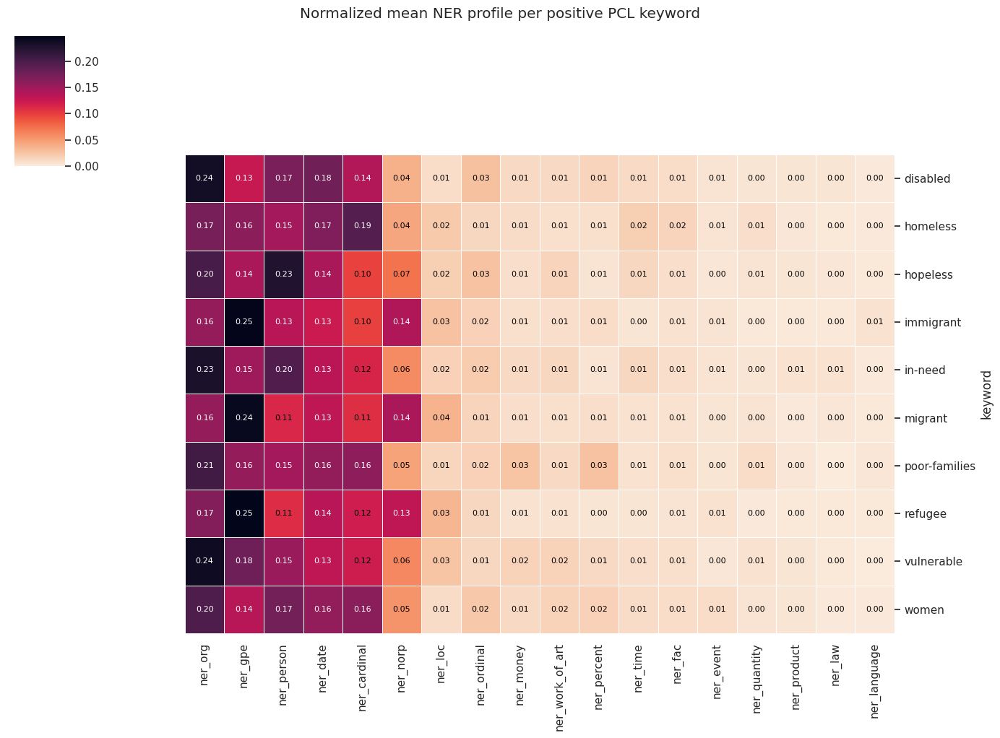

In [80]:
# pick top keywords and top entities
top_keywords = dff['keyword'].value_counts().head(top_k_keywords).index.tolist()
top_entities = dff[ner_cols].sum().nlargest(top_n_entities).index.tolist()

# compute mean profile and row-normalize (so each keyword's profile sums to 1)
profile = dff[dff['keyword'].isin(top_keywords)].groupby('keyword')[top_entities].mean()
profile_norm = profile.div(profile.sum(axis=1).replace(0, 1), axis=0)

# clustered heatmap with a perceptually-uniform sequential cmap
sns.set_context("notebook")
g = sns.clustermap(
    profile_norm,
    method='average',
    metric='correlation',
    cmap='rocket_r',        # good sequential perceptual map, reversed for contrast
    row_cluster=False,
    col_cluster=False,
    figsize=(14,10),
    linewidths=0.5
)
# Annotate each cell with its value (formatted to 2 decimals)
ax = g.ax_heatmap
# use the displayed (possibly reordered) data if available
data_display = getattr(g, 'data2d', profile_norm)
# choose text color for contrast using a simple threshold
thresh = data_display.values.max() / 2.0 if hasattr(data_display, 'values') else None
for i in range(data_display.shape[0]):
    for j in range(data_display.shape[1]):
        val = data_display.values[i, j] if hasattr(data_display, 'values') else data_display[i][j]
        color = 'white' if (thresh is not None and val > thresh) else 'black'
        # place text at cell center (pcolormesh/heatmap cells are centered at x+0.5, y+0.5)
        ax.text(j + 0.5, i + 0.5, f"{val:.2f}", ha='center', va='center', color=color, fontsize=8, transform=ax.transData)
g.fig.suptitle('Normalized mean NER profile per positive PCL keyword', y=1.02)
plt.show()

## Part-of-Speech tagging

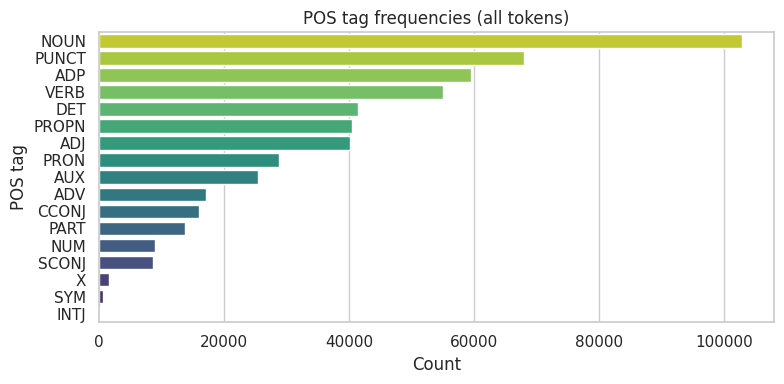

In [81]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import PCA
from umap import UMAP

model_name = 'en_core_web_sm'

pos_counter = Counter()

for doc in get_docs():
    pos_counter.update([tok.pos_ for tok in doc if not tok.is_space])

pos_df = pd.DataFrame(pos_counter.most_common(), columns=['pos','count'])
plt.figure(figsize=(8,4))
sns.barplot(x='count', y='pos', data=pos_df, palette='viridis_r')
plt.title('POS tag frequencies (all tokens)')
plt.xlabel('Count')
plt.ylabel('POS tag')
plt.tight_layout()
plt.show()

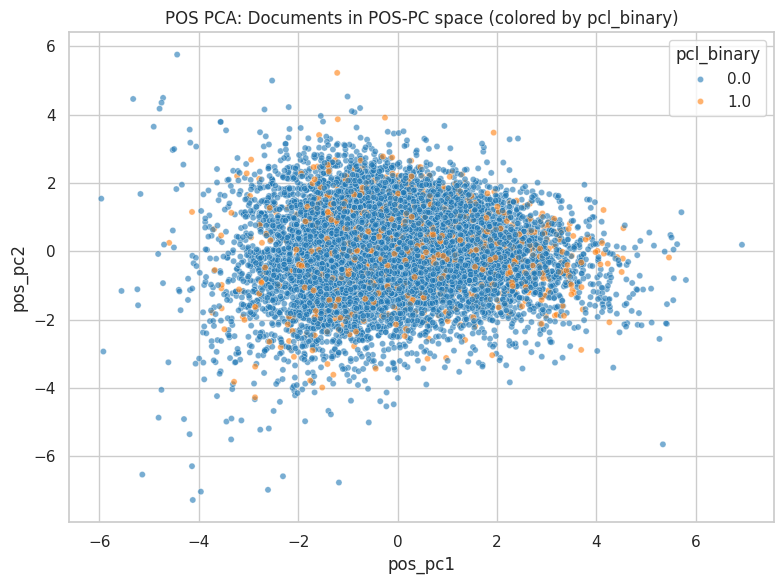

Explained variance (POS PCA): [0.15021927 0.09604043]


In [82]:
# build per-doc POS counts (aligned with df_clean index)
pos_counters = []

for doc in get_docs():
    pos_counters.append(Counter([tok.pos_ for tok in doc if not tok.is_space]))


pos_df = pd.DataFrame(pos_counters, index=df_clean.index).fillna(0).astype(float)
# normalize to proportions per document
pos_prop = pos_df.div(pos_df.sum(axis=1).replace(0,1), axis=0)
# scale and PCA
scaler_pos = StandardScaler()
Xs_pos = scaler_pos.fit_transform(pos_prop)
pca_pos = PCA(n_components=2, random_state=42)
pos_pca = pca_pos.fit_transform(Xs_pos)
pos_pca_df = pd.DataFrame(pos_pca, columns=['pos_pc1','pos_pc2'], index=pos_prop.index)
# plot similar to previous PCA plot
plot_df = pos_pca_df.copy()
plot_df['pcl_binary'] = df_clean.loc[plot_df.index,'pcl_binary'].astype(int)
plt.figure(figsize=(8,6))
sns.scatterplot(x='pos_pc1', y='pos_pc2', hue=plot_df['pcl_binary'], palette=['#1f77b4','#ff7f0e'], data=plot_df.reset_index(), alpha=0.6, s=20)
plt.title('POS PCA: Documents in POS-PC space (colored by pcl_binary)')
plt.legend(title='pcl_binary')
plt.tight_layout()
plt.show()
print('Explained variance (POS PCA):', pca_pos.explained_variance_ratio_)


In [83]:
pos_counters = []
for doc in get_docs():
    pos_counters.append(Counter([tok.pos_ for tok in doc if not tok.is_space]))

pos_df = pd.DataFrame(pos_counters, index=df_clean.index).fillna(0).astype(float)
pos_prop = pos_df.div(pos_df.sum(axis=1).replace(0,1), axis=0)

# compute simple POS summaries per document for hover
dominant_pos = pos_prop.idxmax(axis=1).astype(str)
pos_top3 = pos_prop.apply(lambda r: ', '.join([f"{p}:{r[p]:.2f}" for p in r.nlargest(3).index]), axis=1)

# prepare short preview and contextual fields
text_full = df_clean['text'].astype(str).str.replace('\n', ' ')
text_preview = text_full.str.slice(0, NO_SHOWN_CHRS).astype(str) + text_full.str.slice(NO_SHOWN_CHRS).apply(lambda s: '...' if len(s)>0 else '')
par_id_col = df_clean['par_id'].astype(str) if 'par_id' in df_clean.columns else df_clean.index.astype(str)
keyword_col = df_clean['keyword'].astype(str) if 'keyword' in df_clean.columns else pd.Series(['']*len(df_clean), index=df_clean.index)
country_col = df_clean['country'].astype(str) if 'country' in df_clean.columns else pd.Series(['']*len(df_clean), index=df_clean.index)

# scale features 
scaler = StandardScaler()
X = scaler.fit_transform(pos_prop.fillna(0).values)

reducer = UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
emb = reducer.fit_transform(X)

In [84]:
umap_df = pd.DataFrame(emb, columns=['umap1','umap2'], index=pos_prop.index)
umap_df['pcl_binary'] = df_clean.loc[umap_df.index, 'pcl_binary'].astype(int)
umap_df['label'] = keyword_col.loc[umap_df.index]
umap_df['par_id'] = par_id_col.loc[umap_df.index]
umap_df['country'] = country_col.loc[umap_df.index]
umap_df['token_count'] = df_clean.loc[umap_df.index, 'token_count'] if 'token_count' in df_clean.columns else 0
umap_df['dominant_pos'] = dominant_pos.loc[umap_df.index]
umap_df['pos_top3'] = pos_top3.loc[umap_df.index]
umap_df['text_preview'] = text_preview.loc[umap_df.index]

Saved umap_pos.png


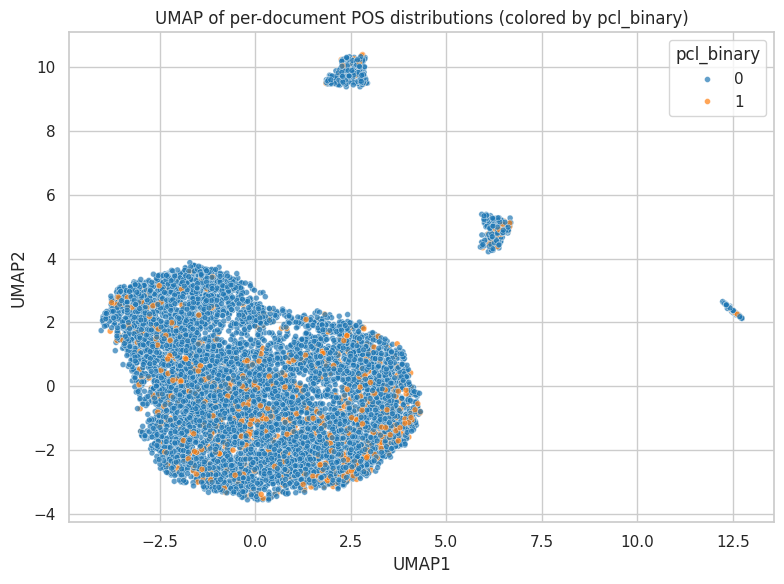

In [85]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='umap1', y='umap2', hue='pcl_binary', palette=['#1f77b4','#ff7f0e'], data=umap_df.reset_index(), alpha=0.7, s=18)
plt.title('UMAP of per-document POS distributions (colored by pcl_binary)')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.legend(title='pcl_binary')
plt.tight_layout()
plt.savefig('umap_pos.png', dpi=150)
print('Saved umap_pos.png')
plt.show()

In [86]:
hover_cols = ['label','par_id','country','token_count','dominant_pos','pos_top3','text_preview']
fig = px.scatter(umap_df.reset_index(), x='umap1', y='umap2', color='pcl_binary',
                    color_discrete_map={'0':'#1f77b4','1':'#ff7f0e'},
                    hover_name='label',
                    hover_data=hover_cols,
                    title='UMAP (POS) interactive')
fig.update_traces(marker=dict(size=6, opacity=0.8))
fig.show()

In [87]:
n_samples = X.shape[0]
perplexity = min(30, max(5, n_samples // 10))

tsne_pos = TSNE(n_components=2, perplexity=perplexity, max_iter=1000, random_state=42, init='pca', learning_rate='auto')
emb_pos = tsne_pos.fit_transform(X)
print(f't-SNE (POS) produced shape: {emb_pos.shape}')

pos_tsne_df = pd.DataFrame(emb_pos, columns=['dim1','dim2'], index=pos_prop.index)
pos_tsne_df['pcl_binary'] = df_clean.loc[pos_tsne_df.index, 'pcl_binary'].astype(int)
pos_tsne_df['label'] = keyword_col.loc[pos_tsne_df.index]
pos_tsne_df['par_id'] = par_id_col.loc[pos_tsne_df.index]
pos_tsne_df['country'] = country_col.loc[pos_tsne_df.index]
pos_tsne_df['token_count'] = df_clean.loc[pos_tsne_df.index, 'token_count'] if 'token_count' in df_clean.columns else 0
pos_tsne_df['dominant_pos'] = dominant_pos.loc[pos_tsne_df.index]
pos_tsne_df['pos_top3'] = pos_top3.loc[pos_tsne_df.index]
pos_tsne_df['text_preview'] = text_preview.loc[pos_tsne_df.index]

t-SNE (POS) produced shape: (10468, 2)


Saved tsne_pos.png


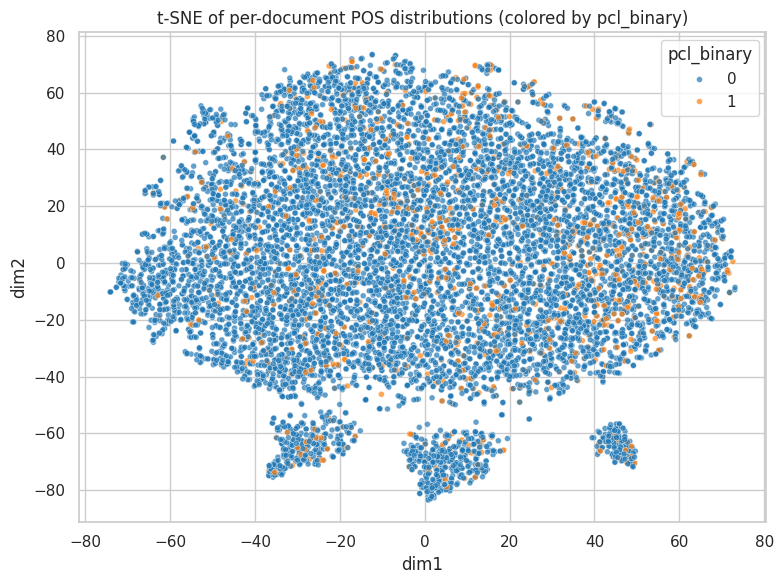

In [88]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='dim1', y='dim2', hue='pcl_binary', palette=['#1f77b4','#ff7f0e'], data=pos_tsne_df.reset_index(), alpha=0.7, s=18)
plt.title('t-SNE of per-document POS distributions (colored by pcl_binary)')
plt.xlabel('dim1')
plt.ylabel('dim2')
plt.legend(title='pcl_binary')
plt.tight_layout()
plt.savefig('tsne_pos.png', dpi=150)
print('Saved tsne_pos.png')
plt.show()

In [89]:
hover_cols_pos = ['label','par_id','country','token_count','dominant_pos','pos_top3','text_preview']
fig = px.scatter(pos_tsne_df.reset_index(), x='dim1', y='dim2', color='pcl_binary',
                    color_discrete_map={'0':'#1f77b4','1':'#ff7f0e'}, hover_name='label', hover_data=hover_cols_pos,
                    title='t-SNE (POS) interactive')
fig.update_traces(marker=dict(size=6, opacity=0.8))
fig.show()

In [90]:
ner_cols = [c for c in dff.columns if c.startswith('ner_')]
X_ner = dff[ner_cols].fillna(0)

if 'token_count' in dff.columns:
    X_ner = X_ner.div(dff['token_count'].replace(0,1), axis=0)

# rarity filter
keep = X_ner.columns[X_ner.sum() > THRESHOLD]
X_ner_keep = X_ner[keep].astype(float)
print(f'Using {X_ner_keep.shape[1]} NER features after rarity filter')

# build simple top-3 NER-per-doc strings for hover (from the kept raw counts)
def ner_top3_str(row):
    s = row.sort_values(ascending=False).head(3)
    parts = [f"{c}:{int(v)}" for c, v in s.items() if v>0]
    return ', '.join(parts) if parts else ''


Using 13 NER features after rarity filter


In [91]:
ner_top3 = X_ner_keep.apply(ner_top3_str, axis=1)

# reduce dimensionality for t-SNE if necessary
if X_ner_keep.shape[1] > 50:
    n_svd = min(30, X_ner_keep.shape[1] - 1)
    svd = TruncatedSVD(n_components=n_svd, random_state=42)
    X_ner_reduced = svd.fit_transform(X_ner_keep)
    print(f'Reduced NER block to {X_ner_reduced.shape[1]} dims with TruncatedSVD')
else:
    X_ner_reduced = X_ner_keep.values

scaler_ner = StandardScaler()
Xn = scaler_ner.fit_transform(np.nan_to_num(X_ner_reduced))

n_samples_n = Xn.shape[0]
perplexity_n = min(30, max(5, n_samples_n // 10))

In [92]:
tsne_ner = TSNE(n_components=2, perplexity=perplexity_n, max_iter=1000, random_state=42, init='pca', learning_rate='auto')
emb_ner = tsne_ner.fit_transform(Xn)
print(f't-SNE (NER) produced shape: {emb_ner.shape}')

ner_tsne_df = pd.DataFrame(emb_ner, columns=['dim1','dim2'], index=dff.index)
ner_tsne_df['pcl_binary'] = dff.loc[ner_tsne_df.index, 'pcl_binary'].astype(int)
ner_tsne_df['label'] = dff.loc[ner_tsne_df.index, 'keyword'].astype(str) if 'keyword' in dff.columns else ner_tsne_df.index.astype(str)
ner_tsne_df['par_id'] = dff.loc[ner_tsne_df.index, 'par_id'].astype(str) if 'par_id' in dff.columns else ner_tsne_df.index.astype(str)
ner_tsne_df['country'] = dff.loc[ner_tsne_df.index, 'country'].astype(str) if 'country' in dff.columns else ''
ner_tsne_df['token_count'] = dff.loc[ner_tsne_df.index, 'token_count'] if 'token_count' in dff.columns else 0
ner_tsne_df['ner_top3'] = ner_top3.loc[ner_tsne_df.index]
ner_tsne_df['text_preview'] = text_preview.loc[ner_tsne_df.index]

t-SNE (NER) produced shape: (10468, 2)


Saved tsne_ner.png


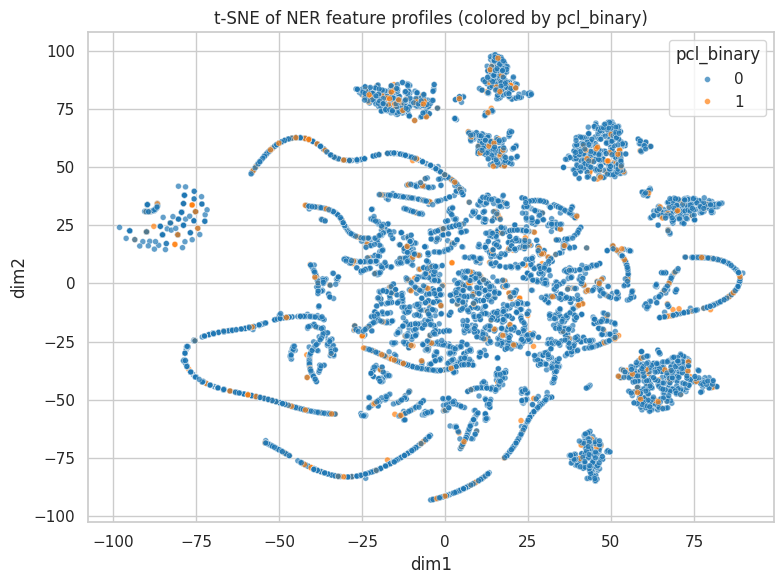

In [93]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='dim1', y='dim2', hue='pcl_binary', palette=['#1f77b4','#ff7f0e'], data=ner_tsne_df.reset_index(), alpha=0.7, s=18)
plt.title('t-SNE of NER feature profiles (colored by pcl_binary)')
plt.xlabel('dim1')
plt.ylabel('dim2')
plt.legend(title='pcl_binary')
plt.tight_layout()
plt.savefig('tsne_ner.png', dpi=150)
print('Saved tsne_ner.png')
plt.show()

In [94]:
hover_cols_ner = ['label','par_id','country','token_count','ner_top3','text_preview']
fig = px.scatter(ner_tsne_df.reset_index(), x='dim1', y='dim2', color='pcl_binary',
                    color_discrete_map={'0':'#1f77b4','1':'#ff7f0e'}, hover_name='label', hover_data=hover_cols_ner,
                    title='t-SNE (NER) interactive')
fig.update_traces(marker=dict(size=6, opacity=0.8))
fig.show()

In [95]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
coords = ner_tsne_df[['dim1','dim2']].values

km = KMeans(n_clusters=12, random_state=0).fit(coords)

print('ARI', adjusted_rand_score(df_clean['pcl_binary'], km.labels_))
print('NMI', normalized_mutual_info_score(df_clean['pcl_binary'], km.labels_))

ARI -0.0002789126245805223
NMI 0.00382655167608426


In [96]:
dfc = ner_tsne_df.assign(cluster=km.labels_, pcl=df_clean['pcl_binary'].values)
purity = dfc.groupby('cluster').apply(lambda g: g['pcl'].value_counts(normalize=True).max()).sort_values(ascending=False)
purity.head()
# get 5 example texts from top clusters biased toward pcl==1
dfc.loc[(dfc['cluster']==purity.idxmax()) & (dfc['pcl']==1)].sample(10)

,dim1,dim2,pcl_binary,label,par_id,country,token_count,ner_top3,text_preview,cluster,pcl
7413,35.519939,-20.498224,1,disabled,7414,hk,32,"ner_cardinal:0, ner_date:0, ner_org:0",Cheung said 20 disabled undergraduate students...,5,1
4537,3.393317,-35.720203,1,hopeless,4538,hk,11,ner_norp:0,"For jobless , hopeless Zimbabweans there is no...",5,1
5954,13.856648,-15.775528,1,hopeless,5955,lk,93,"ner_norp:0, ner_org:0, ner_date:0",The indigenous Palestinians see themselves aba...,5,1
437,19.557674,-5.856817,1,vulnerable,438,nz,46,"ner_date:0, ner_norp:0",Instead of passively paying a sickness benefit...,5,1
10253,32.442085,-5.693904,1,poor-families,10254,ph,45,"ner_gpe:0, ner_cardinal:0, ner_date:0",The Archdioceses of Cebu and Vancouver in Cana...,5,1
2955,24.946472,-13.788954,1,in-need,2956,ke,88,"ner_date:0, ner_org:0, ner_cardinal:0","Over the past five years , the company has don...",5,1
2821,15.962635,-42.561787,1,hopeless,2822,pk,43,"ner_gpe:0, ner_date:0","Yemen , Syria , Iraq and Libya are hopeless ( ...",5,1
9069,14.851040,-19.600292,1,refugee,9070,ca,99,"ner_norp:0, ner_date:0, ner_cardinal:0","""But it 's really not that incredible any more...",5,1
5441,22.498983,-6.321577,1,vulnerable,5442,lk,126,"ner_date:0, ner_gpe:0, ner_norp:0","""Balu , an honest , hard-working labourer , wh...",5,1
10268,1.870550,-36.476086,1,homeless,10269,gb,13,ner_norp:0,Veterans left on scrapheap : The homeless plig...,5,1


In [104]:
# Log-odds ratio with Dirichlet prior (Monroe-style) for 1–4 grams with plots
# Paste into your notebook. Requires: pandas as pd, numpy as np, sklearn, seaborn, matplotlib.
from sklearn.feature_extraction.text import CountVectorizer

# Config
MIN_DF = 5                # min document freq for an ngram
TOP_K = 25                # top-K to plot per side
PRIOR_STRENGTH_REL = 0.02 # prior mass relative to corpus token count (tune)
SAVE_FIGS = False         # set True to save figures
FIG_DIR = '.'             # where to save

texts = df_clean['text'].astype(str)

labels = df_clean['pcl_binary'].astype(int).values
mask_t = labels == 1
mask_r = ~mask_t

def example_texts_for_ngram(ngram, labels_mask, texts_series, n_examples=3):
    idxs = texts_series[labels_mask].str.contains(r'\b' + ngram + r'\b', regex=True, case=False)
    sample = texts_series[labels_mask][idxs]
    return sample.sample(min(len(sample), n_examples)).tolist() if len(sample)>0 else []



def display_logodds_ngram(n):
    vec = CountVectorizer(ngram_range=(n, n), min_df=MIN_DF, token_pattern=r"(?u)\b\w+\b")
    X = vec.fit_transform(texts)
    vocab = np.array(vec.get_feature_names_out())
    counts = X.sum(axis=0).A1.astype(float)
    counts_t = X[mask_t].sum(axis=0).A1.astype(float)
    counts_r = counts - counts_t

    N_t = counts_t.sum()
    N_r = counts_r.sum()
    bg_total = counts.sum() if counts.sum() > 0 else 1.0

    # Dirichlet prior proportional to background frequencies
    prior_mass = PRIOR_STRENGTH_REL * bg_total
    alpha_w = prior_mass * (counts / bg_total)            # vector
    sum_alpha = prior_mass

    # adjusted a/b for each class (a = count + alpha, b = other tokens + rest of prior)
    a_t = counts_t + alpha_w
    b_t = (N_t - counts_t) + (sum_alpha - alpha_w)
    a_r = counts_r + alpha_w
    b_r = (N_r - counts_r) + (sum_alpha - alpha_w)

    # numeric stability
    eps = 1e-12
    a_t = np.maximum(a_t, eps); b_t = np.maximum(b_t, eps)
    a_r = np.maximum(a_r, eps); b_r = np.maximum(b_r, eps)

    logodds = np.log(a_t / b_t) - np.log(a_r / b_r)
    # variance of difference of logs
    var = (1.0 / a_t) + (1.0 / b_t) + (1.0 / a_r) + (1.0 / b_r)
    z = logodds / np.sqrt(var)

    df_ng = pd.DataFrame({
        'ngram': vocab,
        'count': counts.astype(int),
        'count_t': counts_t.astype(int),
        'count_r': counts_r.astype(int),
        'logodds': logodds,
        'z': z
    }).set_index('ngram')

    df_pos = df_ng.sort_values('z', ascending=False).head(TOP_K)
    df_neg = df_ng.sort_values('z').head(TOP_K)

    # Plot
    sns.set_style('whitegrid')
    fig, axes = plt.subplots(1, 2, figsize=(14, max(6, TOP_K*0.22 + 2)))
    sns.barplot(x='z', y=df_pos.index, data=df_pos.reset_index(), ax=axes[0], palette='viridis')
    axes[0].set_title(f'Top {TOP_K} ngrams (higher in pcl_binary=1) — {n}-gram')
    axes[0].set_xlabel('z (log-odds / se)')
    sns.barplot(x='z', y=df_neg.index, data=df_neg.reset_index(), ax=axes[1], palette='magma')
    axes[1].set_title(f'Top {TOP_K} ngrams (higher in pcl_binary=0) — {n}-gram')
    axes[1].set_xlabel('z (log-odds / se)')
    plt.tight_layout()
    if SAVE_FIGS:
        fname = f"{FIG_DIR}/logodds_{n}gram.png"
        fig.savefig(fname, dpi=150, bbox_inches='tight')
        print("Saved", fname)
    plt.show()

    # display small tables and examples for interpretation
    display_cols = ['count_t', 'count_r', 'logodds', 'z']
    display(df_pos[display_cols])
    display(df_neg[display_cols])

    # show 2 examples per top positive feature (if any)
    print("\nExamples for top positive features (pcl_binary=1):")
    for feat in df_pos.head(5).index:
        examples = example_texts_for_ngram(feat, mask_t, texts, n_examples=2)
        print(f"- {feat} (count_t={df_pos.loc[feat,'count_t']}):", examples[:2])

    print("\nExamples for top negative features (pcl_binary=0):")
    for feat in df_neg.head(5).index:
        examples = example_texts_for_ngram(feat, mask_r, texts, n_examples=2)
        print(f"- {feat} (count_r={df_neg.loc[feat,'count_r']}):", examples[:2])

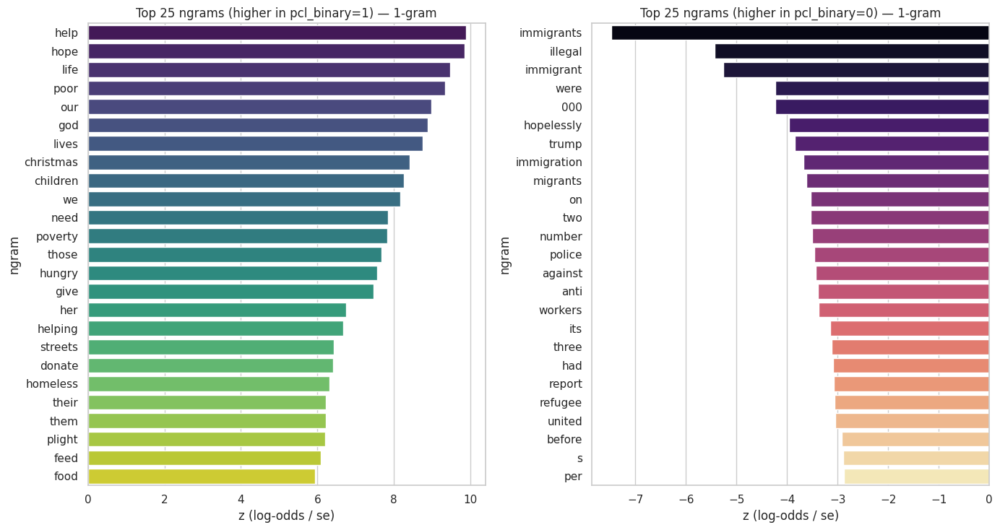

,count_t,count_r,logodds,z
ngram,,,,
help,136,404,0.951103,9.892157
hope,65,106,1.519608,9.855092
life,99,253,1.092439,9.473558
poor,234,956,0.655304,9.341361
our,156,553,0.786057,8.980871
god,36,31,2.132509,8.875919
lives,69,151,1.239034,8.743721
christmas,29,16,2.559194,8.408313
children,199,840,0.624844,8.252216


,count_t,count_r,logodds,z
ngram,,,,
immigrants,44,1252,-0.919496,-7.481250
illegal,6,446,-1.422436,-5.426600
immigrant,15,535,-1.057315,-5.265914
were,92,1279,-0.405396,-4.235592
000,33,629,-0.643776,-4.226161
hopelessly,3,235,-1.443001,-3.955904
trump,13,348,-0.878473,-3.841568
immigration,7,257,-1.073759,-3.677182
migrants,22,436,-0.671733,-3.623835



Examples for top positive features (pcl_binary=1):
- help (count_t=136): ['Bhopal : A day after Prime Minister Narendra Modi launched 21 electronic mandis across the country to help farmers sell their produce online and do away with middlemen , Madhya Pradesh chief minister Shivraj Singh Chouhan was distributing tomatoes free of cost to poor families in Vidisha , as prices crashed to all-time low , Rs 2 a kg , not enough to recover the sowing cost . Not only the tomatoes , wholesale price of onions too have plumetted to 20 to 30 paise a kg , almost negligible , in several districts including Vidisha , Neemuch and Mandsaur , where farmers can not afford even transportation cost .', 'Bond went out of his way to help the less fortunate , often going on the road with Kim to take food to the homeless .']
- hope (count_t=65): ['Daily discrimination facing the disabled in everyday life <h> I hope to be the Rosa Parks of the disabled community <h> Get daily news by email', "A lot of my disabl

In [105]:
display_logodds_ngram(1)

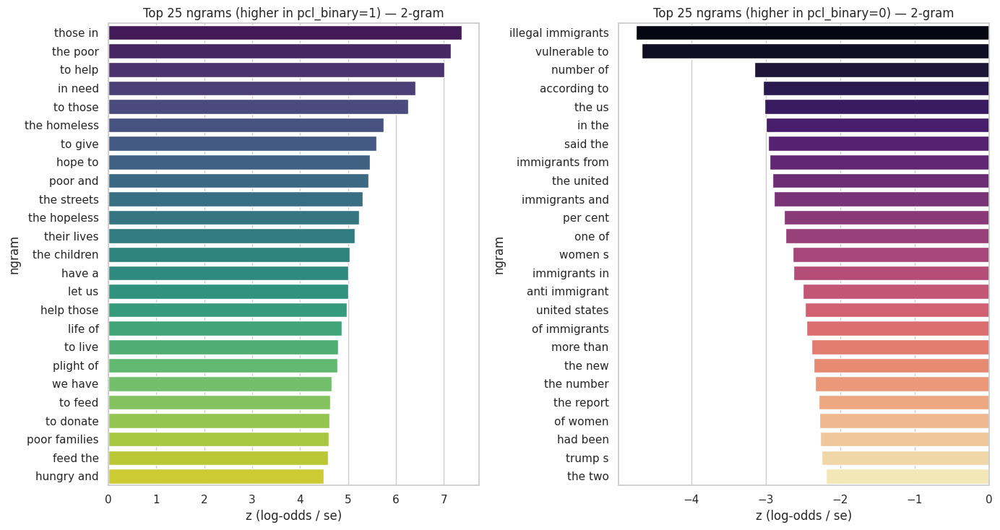

,count_t,count_r,logodds,z
ngram,,,,
those in,55,123,1.165528,7.367919
the poor,50,109,1.189638,7.139550
to help,65,175,0.990125,7.012741
in need,184,841,0.499702,6.399558
to those,31,56,1.368201,6.250901
the homeless,50,146,0.913270,5.745966
to give,32,72,1.159078,5.596885
hope to,13,8,2.401200,5.461131
poor and,21,34,1.472634,5.421394


,count_t,count_r,logodds,z
ngram,,,,
illegal immigrants,3,304,-1.591225,-4.740335
vulnerable to,3,295,-1.581022,-4.662671
number of,15,291,-0.710220,-3.152328
according to,16,293,-0.668128,-3.034622
the us,7,189,-0.937788,-3.014094
in the,220,2203,-0.194370,-2.993645
said the,14,266,-0.695018,-2.970370
immigrants from,0,111,-1.997821,-2.947778
the united,9,205,-0.823523,-2.909312



Examples for top positive features (pcl_binary=1):
- those in (count_t=55): ['"A source told the Mirror : "" Madonna has a deep affiliation with Malawi and has always wanted to do what she can to help those in need ."', 'In the course of the coming week , the season of Lent begins . It is a time for renewal for each one of us , a time to draw closer to the Lord so that he may pick us up and set us again on his pathway to the fullness of life . The steps we are invited to take during Lent include the three traditional Lenten practices : prayer , fasting and almsgiving . We are to make these practices a more constant part of our life and behaviour throughout these next five and a half weeks . Through daily prayer we open our hearts to the Lord ; through fasting , or self-denial , we quieten the clamour within us for self-indulgence ; in almsgiving we have a means of reaching out to those in need , giving expression to our compassion for them .']
- the poor (count_t=50): ['Valerie Siddiq

In [106]:
display_logodds_ngram(2)

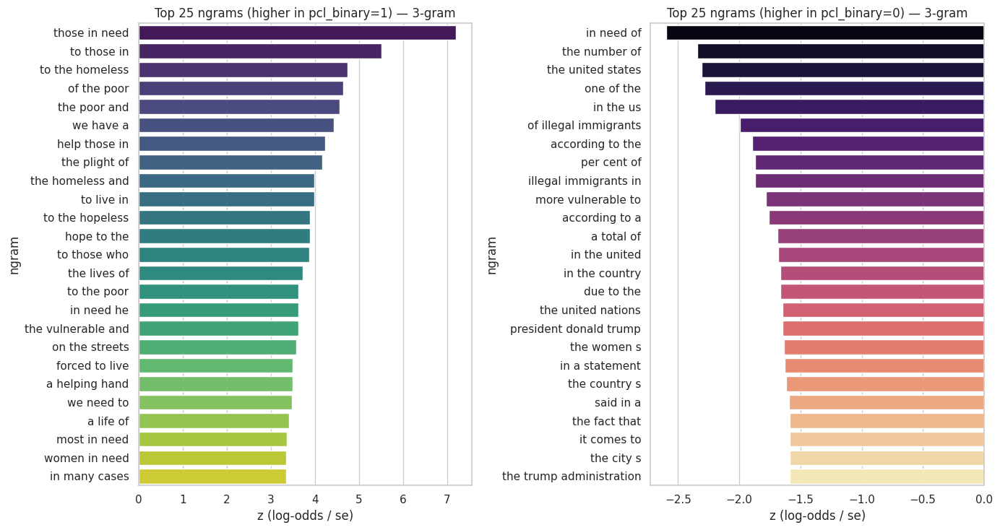

,count_t,count_r,logodds,z
ngram,,,,
those in need,52,110,1.187202,7.204339
to those in,21,31,1.526834,5.509351
to the homeless,12,12,1.899687,4.742156
of the poor,13,16,1.700181,4.641566
the poor and,14,20,1.557192,4.558414
we have a,11,12,1.815831,4.433643
help those in,12,17,1.564906,4.234203
the plight of,13,21,1.439198,4.164241
the homeless and,10,13,1.647108,3.993451


,count_t,count_r,logodds,z
ngram,,,,
in need of,47,547,-0.357608,-2.594666
the number of,6,129,-0.821667,-2.345172
the united states,7,138,-0.760014,-2.309148
one of the,11,179,-0.618531,-2.285242
in the us,1,66,-1.463434,-2.200166
of illegal immigrants,0,49,-2.035418,-1.995281
according to the,5,96,-0.740225,-1.893211
per cent of,3,73,-0.906175,-1.869780
illegal immigrants in,0,43,-2.035265,-1.869017



Examples for top positive features (pcl_binary=1):
- those in need (count_t=52): ["Many donors prefer to remain anonymous , having found a more solid satisfaction comes from knowing what they are doing is truly helping those in need , than is derived from others ' praise .", 'Laois charities called on to sign up for Community Chill food campaign <h> Help those in need get more food donations']
- to those in (count_t=21): ['c . Providing a helping hand to those in need , and it being done through his Being Human foundation , which is translating into tremendous goodwill and enlarged fan following .', 'Bernie is asking other boutique owners to follow her lead and offer up dresses to those in need .']
- to the homeless (count_t=12): ['The Eastridge Christian School in Bramley gathered at their local park to hand over much-needed food parcels to the homeless on 7 March .', 'On the eve of the World Refugee Day , UNHCR received information about three new shipwrecks in the Mediterranean . I

In [107]:
display_logodds_ngram(3)

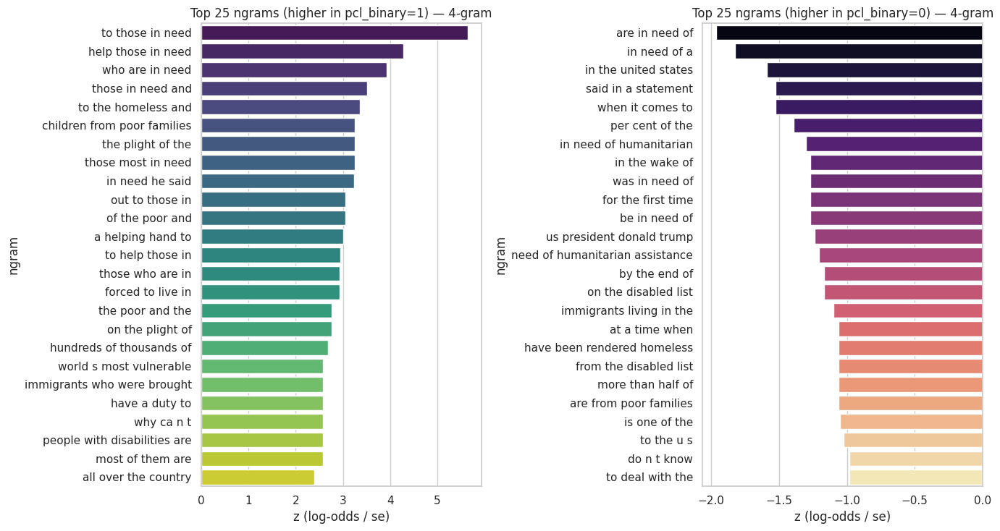

,count_t,count_r,logodds,z
ngram,,,,
to those in need,21,30,1.588520,5.649991
help those in need,12,17,1.587468,4.277087
who are in need,10,14,1.596839,3.920935
those in need and,6,5,2.091930,3.517384
to the homeless and,5,3,2.406116,3.363879
children from poor families,15,41,0.961599,3.257033
the plight of the,7,10,1.574416,3.252434
those most in need,7,10,1.574416,3.252434
in need he said,5,4,2.130090,3.234633


,count_t,count_r,logodds,z
ngram,,,,
are in need of,4,89,-0.840141,-1.963772
in need of a,4,83,-0.790149,-1.825297
in the united states,1,40,-1.205222,-1.588962
said in a statement,0,29,-2.026198,-1.527603
when it comes to,0,29,-2.026198,-1.527603
per cent of the,0,24,-2.025415,-1.389244
in need of humanitarian,0,21,-2.024946,-1.299270
in the wake of,0,20,-2.024789,-1.267876
was in need of,0,20,-2.024789,-1.267876



Examples for top positive features (pcl_binary=1):
- to those in need (count_t=21): ['""" Let us make this occasion more meaningful by offering aid to others , especially to those in need . Let us pray for the welfare and safety of our countrymen and for lasting peace in our nation so that we can all work together in harmony towards real change , "" he said ."', '""" The United States respects and admires your nation \'s compassionate response to those in need "" ."']
- help those in need (count_t=12): ['"Regardless of your situation , being generous is a good idea . Why ? "" The generous will prosper ; those who refresh others will themselves be refreshed . "" Proverbs 11:25 , NLT . "" And I have been a constant example of how you can help those in need by working hard . You should remember the words of the Lord Jesus : \' It is more blessed to give than to receive . \' "" Acts 20:35 , NLT"', 'Fasting bridges the gap between rich and poor , sustained and impoverished , fulfilled and 

In [108]:
display_logodds_ngram(4)